<a href="https://colab.research.google.com/github/vivianconrad/neural-networks-and-deep-learning/blob/main/More_Human_Face_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Human Face Recognition - 1 (Training)
# Capturing frames from video and store them in human_faces folder

!mkdir human_faces 

In [ ]:
# Import Computer Vision package - cv2
import cv2

# Import Numerical Python package - numpy as np
import numpy as np

from google.colab.patches import cv2_imshow

In [ ]:
# Load human face cascade file using cv2.CascadeClassifier built-in function
# cv2.CascadeClassifier([filename]) 
face_detect = cv2.CascadeClassifier('haarcascade_frontalface.xml')
eye_cascade = cv2.CascadeClassifier("haarcascade_eye.xml")
smile_detect = cv2.CascadeClassifier('haarcascade_smile.xml')

In [ ]:
# Check if human face cascade file is loaded
if face_detect.empty():
	raise IOError('Unable to haarcascade_frontalface.xml file')

In [ ]:
# Defining face_detector function 
def face_detector(image):
    # Function detects faces and returns the cropped face
    # If no face detected, it returns the input image
    
    # Convert RGB to gray using cv2.COLOR_BGR2GRAY built-in function
	# BGR (bytes are reversed)
	# cv2.cvtColor: Converts image from one color space to another
    gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    
    # Detect objects(faces) of different sizes using cv2.CascadeClassifier.detectMultiScale
    # cv2.CascadeClassifier.detectMultiScale(gray, scaleFactor, minNeighbors)
   
    # scaleFactor: Specifies the image size to be reduced
    # Faces closer to the camera appear bigger than those faces in the back.
    
    # minNeighbors: Specifies the number of neighbors each rectangle should have to retain it
    # Higher value results in less detections but with higher quality
        
    face_detection = face_detect.detectMultiScale(gray, 1.3, 5)
    
    if face_detection is ():
        return None
    
    # Faces are cropped when they detected
    for (x,y,w,h) in face_detection:
        face_cropped = image[y:y+h, x:x+w]

    return face_cropped

In [ ]:
# Initializing video capturing object
capture = cv2.VideoCapture('video_1_vc.mp4')

In [ ]:
# Initialize face_count to zero
face_count = 0

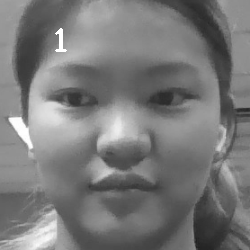

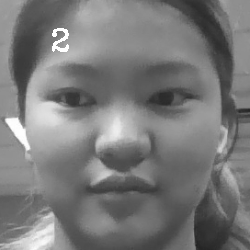

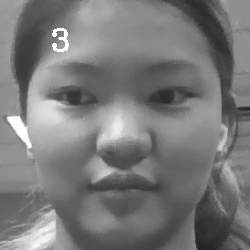

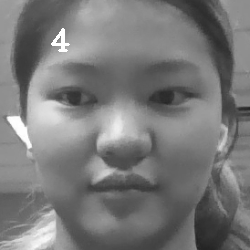

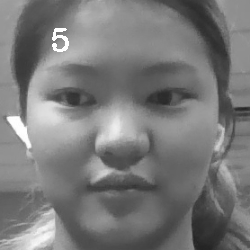

...

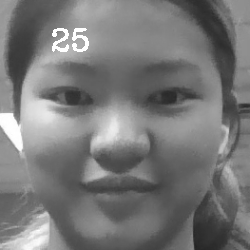

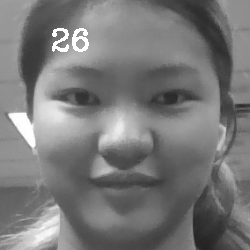

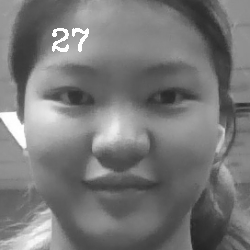

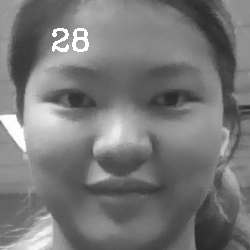

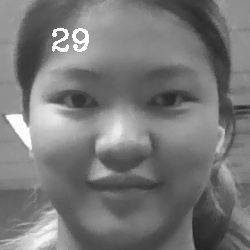

Face NOT detected


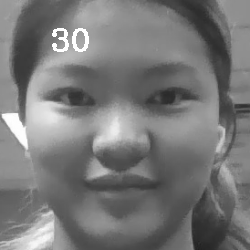

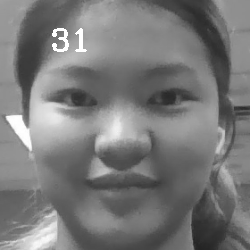

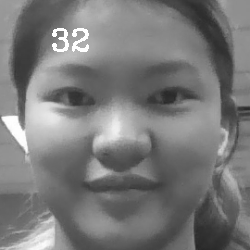

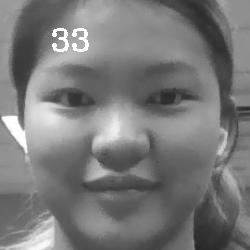

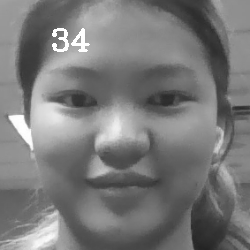

...

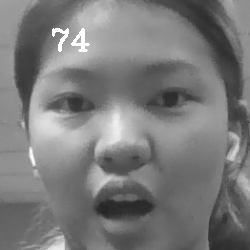

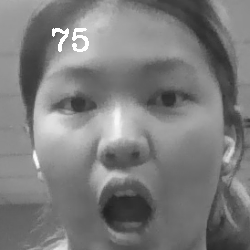

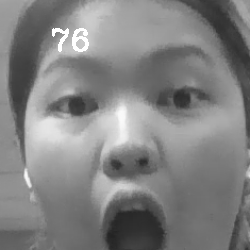

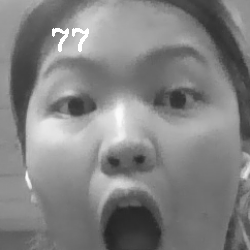

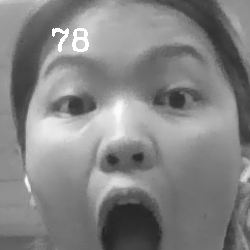

Face NOT detected
Face NOT detected
Face NOT detected
Face NOT detected
Face NOT detected
Face NOT detected
Face NOT detected


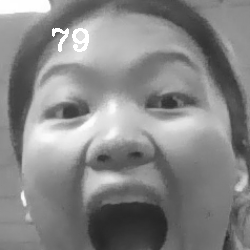

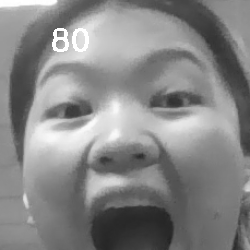

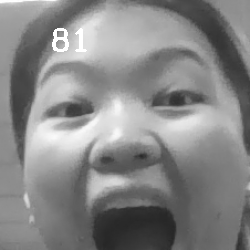

Face NOT detected


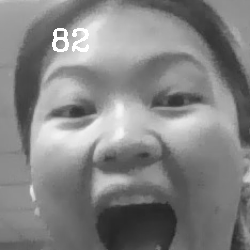

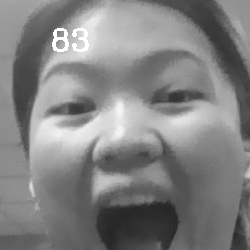

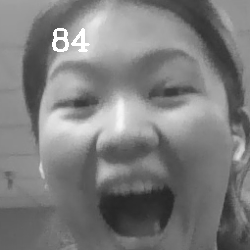

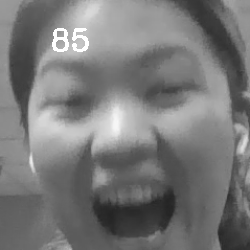

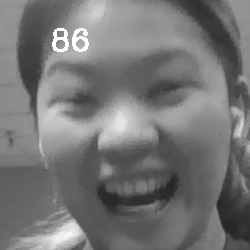

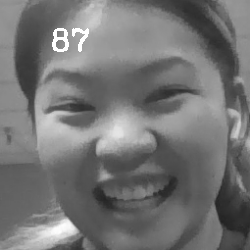

Face NOT detected


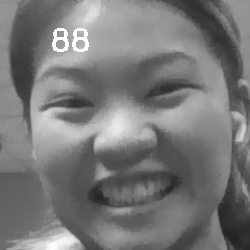

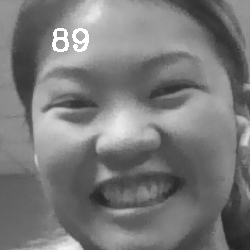

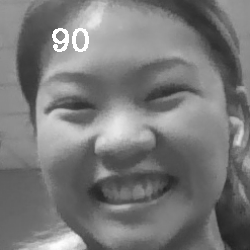

Face NOT detected


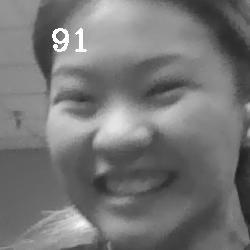

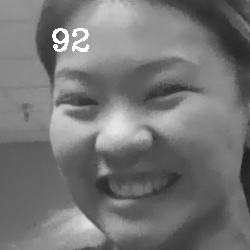

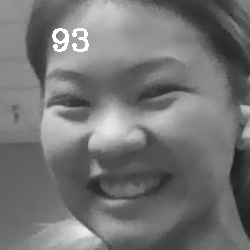

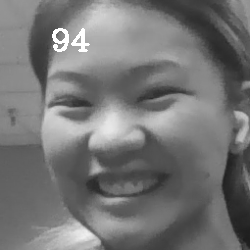

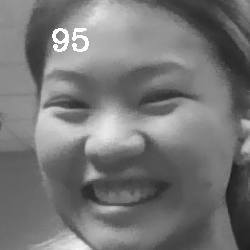

...

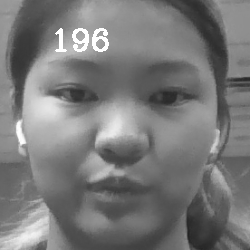

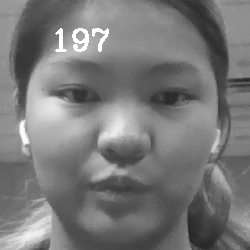

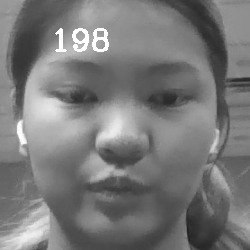

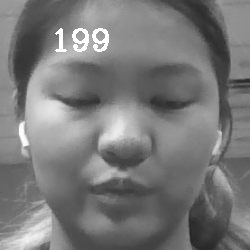

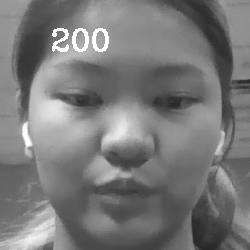

All cropped faces are saved in human_faces folder


In [ ]:
# Initialize While Loop and execute until Esc key is pressed OR face_count == 200
while True:
	# Start capturing frames
	ret, capturing = capture.read()
	
	if face_detector(capturing) is not None:
		face_count += 1
		# Resize the frame using cv2.resize built-in function
		# cv2.resize(capturing, output image size, x scale, y scale, interpolation)
		resized_frame = cv2.resize(face_detector(capturing), (250, 250))
		
		# Convert RGB to gray using cv2.COLOR_BGR2GRAY built-in function
		# BGR (bytes are reversed)
		# cv2.cvtColor: Converts image from one color space to another
		gray = cv2.cvtColor(resized_frame, cv2.COLOR_BGR2GRAY)

        # Cropped faces are saved in human_faces folder
        # Unique name is given to each cropped face 
		path = './human_faces/' + str(face_count) + '.jpg'
		
		# Save cropped faces in specified path using imwrite built-in function
		cv2.imwrite(path, gray)
		
        
        # Display face_count on cropped faces using cv2.putText
		#cv2.putText(image, string, orgin, font, fontScale, color, thickness)
		cv2.putText(gray, str(face_count), (50, 50), cv2.FONT_HERSHEY_COMPLEX, 1, (255,255,0), 2)
		
		# Display cropped faces using imshow built-in function
		cv2_imshow(gray)
        
	else:
		print("Face NOT detected")
		pass

	if cv2.waitKey(1) == 27 or face_count == 200: # 27 is the Esc Key
		break
        
# Close the capturing device
capture.release()

# Close all windows
cv2.destroyAllWindows()
   
print("All cropped faces are saved in human_faces folder")


In [ ]:
# Initializing video capturing object
capture = cv2.VideoCapture('video_2_vc.mp4')

In [ ]:
# Initialize face_count to zero
face_count = 0

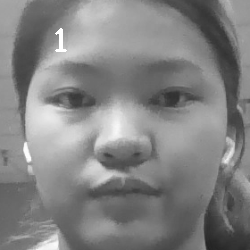

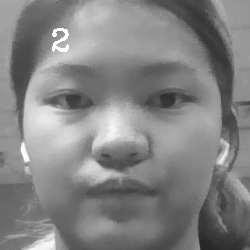

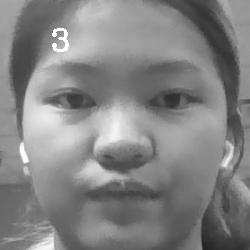

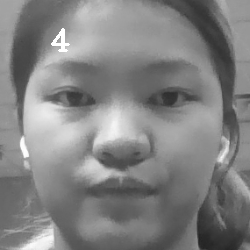

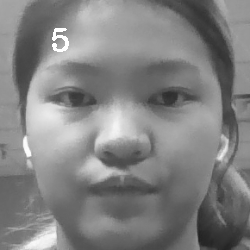

...

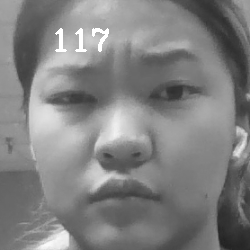

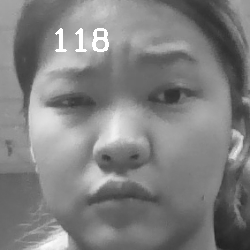

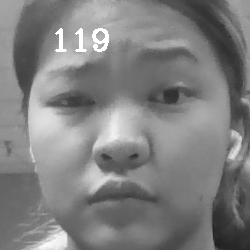

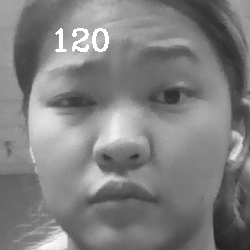

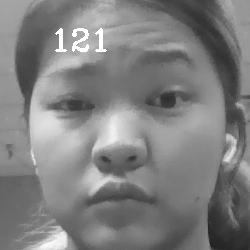

Face NOT detected


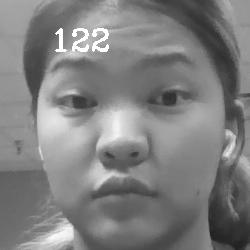

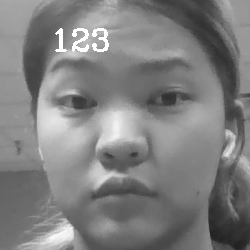

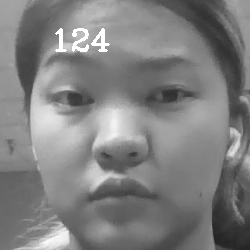

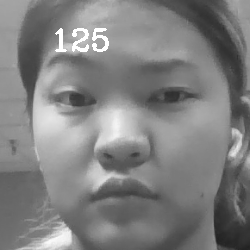

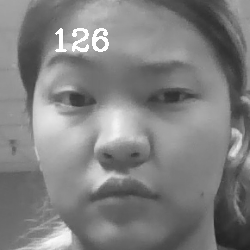

...

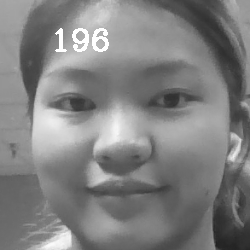

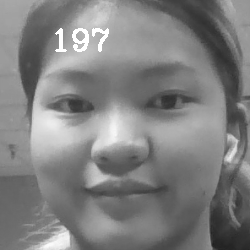

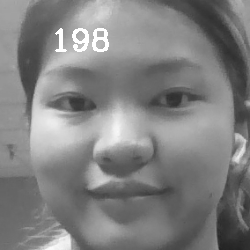

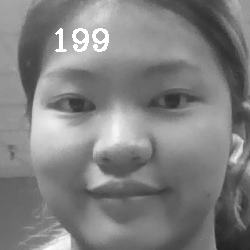

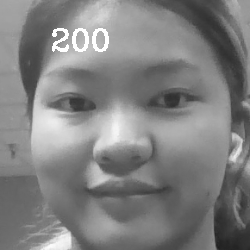

All cropped faces are saved in human_faces folder


In [ ]:
# Initialize While Loop and execute until Esc key is pressed OR face_count == 200
while True:
	# Start capturing frames
	ret, capturing = capture.read()
	
	if face_detector(capturing) is not None:
		face_count += 1
		# Resize the frame using cv2.resize built-in function
		# cv2.resize(capturing, output image size, x scale, y scale, interpolation)
		resized_frame = cv2.resize(face_detector(capturing), (250, 250))
		
		# Convert RGB to gray using cv2.COLOR_BGR2GRAY built-in function
		# BGR (bytes are reversed)
		# cv2.cvtColor: Converts image from one color space to another
		gray = cv2.cvtColor(resized_frame, cv2.COLOR_BGR2GRAY)

        # Cropped faces are saved in human_faces folder
        # Unique name is given to each cropped face 
		path = './human_faces/' + str(face_count) + '.jpg'
		
		# Save cropped faces in specified path using imwrite built-in function
		cv2.imwrite(path, gray)
		
        
        # Display face_count on cropped faces using cv2.putText
		#cv2.putText(image, string, orgin, font, fontScale, color, thickness)
		cv2.putText(gray, str(face_count), (50, 50), cv2.FONT_HERSHEY_COMPLEX, 1, (255,255,0), 2)
		
		# Display cropped faces using imshow built-in function
		cv2_imshow(gray)
        
	else:
		print("Face NOT detected")
		pass

	if cv2.waitKey(1) == 27 or face_count == 200: # 27 is the Esc Key
		break
        
# Close the capturing device
capture.release()

# Close all windows
cv2.destroyAllWindows()
   
print("All cropped faces are saved in human_faces folder")


In [ ]:
# Human Face Recognition - 2 (Testing)
# Training using face images stored in human_faces folder
# Testing using frames from the video

# From Operating System(os) to return a list containing names
# of the entries in the directory given by path - os.listdir(path)
from os import listdir
 
# os.path.isfile(path) - Returns True if path is an existing file
from os.path import isfile, join

In [ ]:
# Face images for training are taken from human_faces folder
path = './human_faces/'

In [ ]:
# To filter only files in the specified path we use:
path_files = [f for f in listdir(path) if isfile(join(path, f))]

In [ ]:
# Two arrays are created, Training and Index(Label)
Training, Index = [], []

In [ ]:
# Training images are opened from the path and
# numpy array is created for training images 

for i, files in enumerate(path_files):
	#enumerate(path_files) loops over path_files & has automatic counter
    
    # Concatenate path and path_files in path_image variable
    path_image = path + path_files[i]
    
    # Train images are read from path_image and converted to gray
    train_images = cv2.imread(path_image, cv2.IMREAD_GRAYSCALE)
    
    # Convert train images into numpy array using np.asarray and
    # append it with Training array 
    # Training.append(np.array(train_images, dtype)
    # dtype=unit8 is an unsigned 8 bit integer (0 to 255)
    Training.append(np.asarray(train_images, dtype=np.uint8))
    
    # Index array is appending for every i value
    Index.append(i)

In [ ]:
# Numpy array is created for Index using np.asarray
# np.array(Index, dtype)
# dtype=np.int32 is an 32 bit integer
Index = np.asarray(Index, dtype=np.int32)

In [ ]:
# Local Binary Pattern Histogram (LBPH) is used for face recognition
# LBP - For each pixel in grayscale image, neighborhood of size r 
# is selected surrounding the center pixel. LBP value is calculated
# for this center pixel and stored in the output 2D array.

# Histogram - Graphical representation of tonal distribution in image

face_recognizer = cv2.face.LBPHFaceRecognizer_create() 
# OpenCV 3.0 use cv2.face.createLBPHFaceRecognizer()


In [ ]:
# Train the face_recognizer 
face_recognizer.train(np.asarray(Training), np.asarray(Index))
print("Training completed successfully")

Training completed successfully


In [ ]:
# Load human face cascade file using cv2.CascadeClassifier built-in function
# cv2.CascadeClassifier([filename]) 
face_detect = cv2.CascadeClassifier('haarcascade_frontalface.xml')

# Check if human face cascade file is loaded
if face_detect.empty():
	raise IOError('Unable to haarcascade_frontalfacet.xml file')

In [ ]:
# Defining face_detector function 
def face_detector(image, size=0.5):
    
    # Convert image to grayscale
    # Convert RGB to gray using cv2.COLOR_BGR2GRAY built-in function
	# BGR (bytes are reversed)
	# cv2.cvtColor: Converts image from one color space to another
    gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    
	# Detect objects(faces) of different sizes using cv2.CascadeClassifier.detectMultiScale
    # cv2.CascadeClassifier.detectMultiScale(gray, scaleFactor, minNeighbors)
   
    # scaleFactor: Specifies the image size to be reduced
    # Faces closer to the camera appear bigger than those faces in the back.
    
    # minNeighbors: Specifies the number of neighbors each rectangle should have to retain it
    # Higher value results in less detections but with higher quality
        
    face_detection = face_detect.detectMultiScale(gray, 1.3, 5)

    if face_detection is ():
        return image, []
    
    for (x,y,w,h) in face_detection:
        
        def detect(gray, frame):    
            faces = face_cascade.detectMultiScale(gray, 1.3, 5)
            for (x, y, w, h) in faces:
                cv2.rectangle(frame, (x, y), ((x + w), (y + h)), (255, 0, 0), 2)
                roi_gray = gray[y:y + h, x:x + w]
                roi_color = frame[y:y + h, x:x + w]
                smiles = smile_cascade.detectMultiScale(roi_gray, 1.8, 20)

    for (sx, sy, sw, sh) in smiles:
        cv2.rectangle(roi_color, (sx, sy), ((sx + sw), (sy + sh)), (0, 0, 255), 2)
        return frame

		# Rectangles are drawn around the face image using cv2.rectangle built-in function
		# cv2.rectangle(image, (x1,y1), (x2,y2), color, thickness)
        cv2.rectangle(image,(x,y),(x+w,y+h),(0,0,255),4)
        
        # Crop the face within the rectangle
        cropped = image[y:y+h, x:x+w]
        
        # Cropped face is resized to the same dimension as trained image (250 x 250)
		# cv2.resize(capturing, output image size, x scale, y scale, interpolation)
        cropped = cv2.resize(cropped, (250, 250))
    
    return image, cropped

In [ ]:
capture = cv2.VideoCapture('video_5_vc.mp4')
# load the video for testing

In [ ]:
# Initialize While Loop and execute until Esc key is pressed
while True:
    # Start capturing frames
	ret, capturing = capture.read()
    
    # Call the function face_detector
	image, faces, smile = face_detector(capturing)
    
	try:
		# Convert RGB to gray using cv2.COLOR_BGR2GRAY built-in function
		# BGR (bytes are reversed)
		# cv2.cvtColor: Converts image from one color space to another
		faces = cv2.cvtColor(faces, cv2.COLOR_BGR2GRAY)

        # Faces is passed to the prediction model
		matching = face_recognizer.predict(faces)
        # matching tuple contains the index and the score (confidence) value 
        
		if matching[1] < 500:
			score = int( 100 * (1 - (matching[1])/350) )
			string = str(score) + '% Matching Confidence'
        
		if score > 60:
			# Input the text string using cv2.putText
			#cv2.putText(image, string, orgin, font, fontScale, color, thickness)
			cv2.putText(image, string, (100, 100), cv2.FONT_HERSHEY_COMPLEX, 1, (0,255,255), 2)
			cv2.putText(image, "Welcome Vi", (210, 40), cv2.FONT_HERSHEY_COMPLEX, 1, (0,255,255), 2)
			
			# Display Real-time Face Recognition using imshow built-in function
			cv2_imshow(image)
		
		else:
			cv2.putText(image, "This is NOT Vi. Get OUT.", (150, 100), cv2.FONT_HERSHEY_COMPLEX, 1, (0,0,255), 3)
			cv2_imshow(image)

	except:
		cv2.putText(image, "FACE NOT FOUND ", (150, 250) , cv2.FONT_HERSHEY_COMPLEX, 1, (0,0,255), 3)
		cv2_imshow(image)
		pass
        
	c = cv2.waitKey(1)
	if c == 27:
		break
        
# Close the capturing device
capture.release()

# Close all windows
cv2.destroyAllWindows()    

NameError: ignored